In [88]:
import os

import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt


1. Take several pictures of red, blue, and green items with your phone or other digital camera (or download some from the internet, if a camera isn’t available).

    1. Load each image, and convert it to a tensor.
    2. For each image tensor, use the `.mean()` method to get a sense of how bright the image is.

    3. Take the mean of each channel of your images. Can you identify the red, green, and blue items from only the channel averages?

2. Select a relatively large file containing Python source code.

    1. Build an index of all the words in the source file (feel free to make your tokenization as simple or as complex as you like; we suggest starting with replacing `r"[^a-zA-Z0-9_]+"` with spaces).

    2. Compare your index with the one we made for Pride and Prejudice. Which is larger?

    3. Create the one-hot encoding for the source code file.

    4. What information is lost with this encoding? How does that information compare to what’s lost in the Pride and Prejudice encoding?

In [78]:
data_dir = '../data/p1ch4/rgb/'

images = [Image.open(os.path.join(root, file)) 
            for root, _, files in os.walk(data_dir)
            for file in files if file.endswith('.jpg') ]

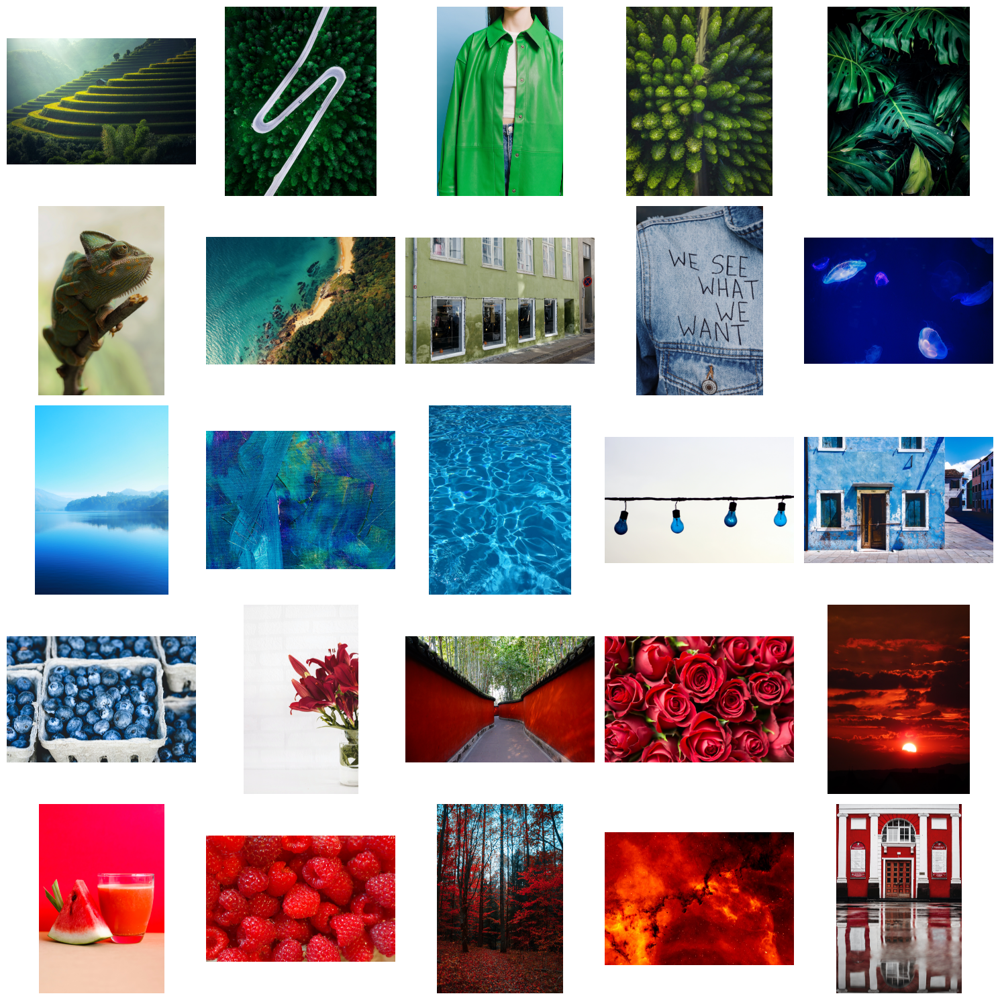

In [87]:
fig, axes = plt.subplots(5, 5, figsize=(15, 15)) 
for ax, img in zip(axes.flat, images):
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [79]:
preprocess = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

images_t = torch.zeros(len(images), 3, 256, 256, dtype=torch.float32)
images_t.shape

torch.Size([25, 3, 256, 256])

In [80]:
for i, img in enumerate(images):
    img = preprocess(img)
    images_t[i] = img

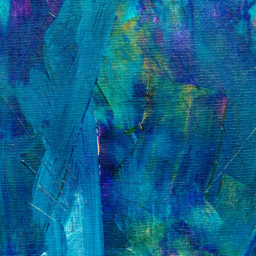

In [83]:
transforms.ToPILImage()(images_t[11])

In [98]:
img_means = [torch.mean(img).item() for img in images_t]

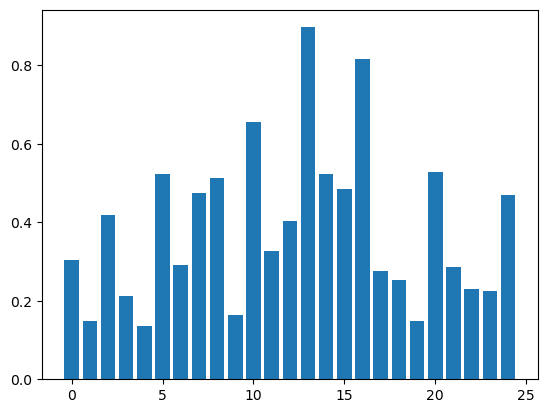

In [100]:
plt.bar(x = range(len(img_means)), height= img_means);

In [110]:
images_t[0, 0].mean(), images_t[0, 0, :, :].mean()

(tensor(0.2760), tensor(0.2760))

In [111]:
channel_means = []

for img in images_t:
    channel_means.append({'red': torch.mean(img[0]).item(),
                         'green': torch.mean(img[1]).item(),
                         'blue': torch.mean(img[2]).item()
                         })

channel_means[0]

{'red': 0.2759898900985718,
 'green': 0.3441733121871948,
 'blue': 0.29042646288871765}

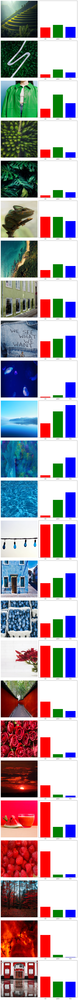

In [112]:
import matplotlib.pyplot as plt
import torch

# Assuming images_t is a list of image tensors and channel_means is your list of dictionaries
n_images = len(images_t)  # Assuming this is 25 or so

fig, axs = plt.subplots(n_images, 2, figsize=(10, 5*n_images))

for i, (img_t, means) in enumerate(zip(images_t, channel_means)):
    # Plot image
    axs[i, 0].imshow(img_t.permute(1, 2, 0))  # Convert CxHxW to HxWxC for plotting
    axs[i, 0].axis('off')
    
    # Plot channel means
    colors = ['red', 'green', 'blue']
    axs[i, 1].bar(colors, [means[color] for color in colors], color=colors)
    axs[i, 1].set_ylim(0, 1)  # Assuming normalized channel means
    axs[i, 1].tick_params(labelleft=False, left=False)  # Hide y-axis ticks and labels

plt.tight_layout()
plt.show()

### Part 2: NLP

In [121]:
source_file = '../data/p1ch4/source-code/_dtypes.py'

with open(source_file, encoding='utf8') as f:
    text = f.read()

text[:100]

'# mypy: ignore-errors\n\n""" Define analogs of numpy dtypes supported by pytorch.\nDefine the scalar ty'

In [131]:
cleaned_text = ''.join([char if char.isalnum() or char=='_' else ' ' for char in text])
cleaned_text[:100]

'  mypy  ignore errors      Define analogs of numpy dtypes supported by pytorch  Define the scalar ty'

In [144]:
words = sorted(set(cleaned_text.split()))
chr2i = {chr:i for i, chr in enumerate(words)}
len(words) # much smaller than Jane Austen text which has 7261 words

324

In [149]:
chr2i['dtype']

132

In [152]:
word_onehot = torch.zeros(len(words), len(words))

for i, word in enumerate(words):
    idx = chr2i[word]
    word_onehot[i][idx] = 1
    if i < 15 :
        print(f'{idx} {word}')

0 0
1 1
2 24
3 4
4 All
5 AllFloat
6 AllInteger
7 Allowed
8 B
9 Bbhil
10 Complex
11 D
12 DType
13 DTypes
14 Default


In [153]:
word_onehot

tensor([[1., 0., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 0., 1.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 1., 0., 0.],
        [0., 0., 0.,  ..., 0., 1., 0.],
        [0., 0., 0.,  ..., 0., 0., 1.]])

In [ ]:
# what information did we lose?
# We lose the syntactical structure of a code file. Similar to Jane Austen, in which, the arrangement of words had some meaning to it